# Домашнее задание №2

Задание присылать на обе почты почты aleksartamonov@gmail.com dashkov.alexander.om@gmail.com в виде ссылки на colab

В теме письма указать **CV_HSE_2021 HW1 <Фамилия Имя>**

soft deadline: 14.03.2021T23:59:00+0300

hard deadline: 21.03.2021T23:59:00+0300

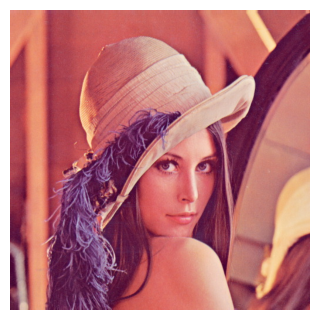

In [1]:
import cv2
import matplotlib.pylab as plt
%matplotlib inline
plt.style.use('default')

def show(img, size=3):
    plt.figure(figsize=(size,size))
    ax = plt.axes([0,0,1,1], frameon=False)
    ax.set_axis_off()
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

lena = cv2.imread("lena.jpg")
show(lena)

**1. (5 баллов)** С помощью [виджетов](http://ipywidgets.readthedocs.io/en/latest/examples/Widget%20List.html) создайте 2 слайдера с настройками параметров гамма-коррекции. Отобразите **lena**, ее гамма-преобразование и график в диапозоне от [0;1], так, чтобы параметры слайдера соответствовали параметрам гамма-коррекции. 

In [2]:
import ipywidgets as widgets
import numpy as np

In [ ]:
lena = cv2.imread("lena.jpg")
init_image = lena 

def show_gamma(img, transformed_img, values, size=3):
    fig, ax = plt.subplots(1, 3, figsize=(3.5 * size, size))
    ax[0].set_title('True Lena')
    ax[0].set_axis_off()
    ax[0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    
    ax[1].set_title('Transformed Lena')
    ax[1].set_axis_off()
    ax[1].imshow(cv2.cvtColor(transformed_img, cv2.COLOR_BGR2RGB))
    
    ax[2].set_xlim(-0.01, 1.01)
    ax[2].set_ylim(0, 1.01)
    ax[2].set_xlabel('input values')
    ax[2].set_ylabel('output values')
    ax[2].set_title('Gamma correction')
    ax[2].plot(np.arange(0, 256) / 255., values / 255.)

# здесь можно поменять interact_manual на interact
# но обновление будет подтормаживать

@widgets.interact_manual(A=(0, 2, .2), gamma=(0, 3, 0.1))
def lena_gamma_correction(A=1, gamma=1):
    table = np.array([A * ((i / 255.0) ** gamma) * 255 for i in np.arange(0, 256)]).clip(0, 255).astype("uint8")	
    img = cv2.LUT(init_image, table)
    show_gamma(lena, img, table)
    

interactive(children=(FloatSlider(value=1.0, description='A', max=2.0, step=0.2), FloatSlider(value=1.0, descr…

**2. (5 баллов)** Загрузите изображение $lena.jpg$. Переведите изображение в градации серого. Примените к серому изображению операцию линейного растяжения диапазона яркостей ($normalize$) и эквализации гистограммы ($equalizeHist$). Постройте разность полученных результатов. Состыкуйте в одно изображение в градациях серого результат линейного растяжения, эквализации и их разности.

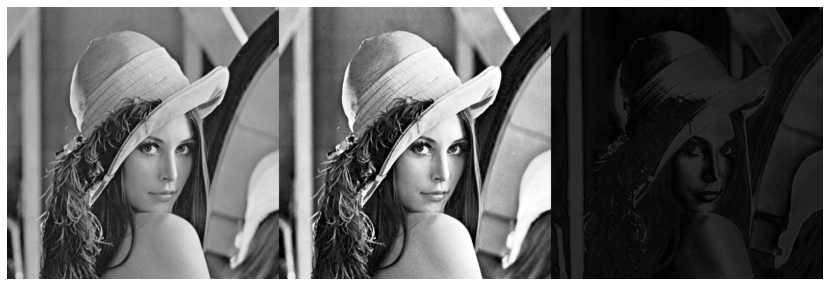

In [ ]:
lena_gray = cv2.cvtColor(lena, cv2.COLOR_BGR2GRAY)
lena_norm = cv2.normalize(lena_gray, None, 0, 255, cv2.NORM_MINMAX)
lena_eq = cv2.equalizeHist(lena_gray)

result = np.concatenate((lena_norm, lena_eq, cv2.absdiff(lena_norm, lena_eq)), axis=1)
plt.figure(figsize=(15, 5))
plt.axis('off')
plt.imshow(result, cmap='gray')
plt.show()

**3. (5 баллов)** Реализуйте функцию добавления шума «соль и перец» для одноканального изображения. Входные параметры: $src$ – исходная одноканальная матрица $Mat$, $p$ – вероятность замещения исходных значений на $0$, $q$ – вероятность замещения исходных значений на $255$. Загрузите изображение $lena.jpg$, выделите каналы изображения в отдельные матрицы ($split$), добавьте шум «соль и перец» в каждый канал при помощи реализованной Вами функции с параметрами

1. $p=q=0.05$
2. $p=q=0.1$
3. $p=q=0.15$

In [ ]:
def salt_pepper(src, p, q):
    h, w = src.shape
    black = np.ceil(h * w * p)
    white = np.ceil(h * w * q)

    coords = [np.random.randint(0, i - 1, int(black)) for i in src.shape]
    src[coords[0], coords[1]] = 0

    coords = [np.random.randint(0, i - 1, int(white)) for i in src.shape]
    src[coords[0], coords[1]] = 255

    return src

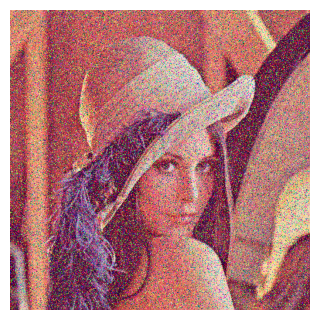

In [ ]:
b, g, r = cv2.split(lena)
b = salt_pepper(b, p=0.05, q=0.05)
g = salt_pepper(g, p=0.1, q=0.1)
r = salt_pepper(r, p=0.15, q=0.15)

img = cv2.merge((b,g,r))
show(img)

**4. (5 баллов)** Удалите диагональные полоски с изображения $lena\_diagonal.jpg$. Вычислите среднеквадратичную ошибку (mean squared error, $MSE$) для полученного результата и изображения $lena\_gray\_512.tif$. Задача будет засчитана при $MSE < 1500$. Тот, у кого по результатам проверки будет наименьшее значение MSE среди всех студентов для этой задачи, получит призовую шоколадку (раньше мы раздавали призовые баллы, но теперь у нас концепция фиксированного максимального количества баллов)

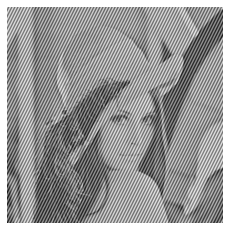

In [110]:
img = cv2.imread("lena_diagonal.jpg", 0)
show(img)

img_target = cv2.imread("lena_gray_512.tif", 0)

In [229]:
img_diag = img.copy()
rows, cols = img_diag.shape
crow, ccol = int(rows/2) , int(cols/2)

f = np.fft.fft2(img_diag)
fshift = np.fft.fftshift(f)
magnitude_spectrum = 20 * np.where(np.abs(fshift) != 0, np.log(np.abs(fshift)), 0)

# create mask
Y, X = np.ogrid[:rows, :cols]
dist_from_center = np.sqrt((X - crow)**2 + (Y - ccol)**2)
mask = (dist_from_center <= 200)
fshift[~mask] = 0
fshift[:, 165:190] = 0
fshift[:, -190:-165] = 0
fshift[215:225, :210] = 0

magnitude_spectrum_mask = 20 * np.where(np.abs(fshift) != 0, np.log(np.abs(fshift)), 0)

f_ishift = np.fft.ifftshift(fshift)
img_back = np.fft.ifft2(f_ishift)
img_back = np.abs(img_back)

mse: 883.3198776245117



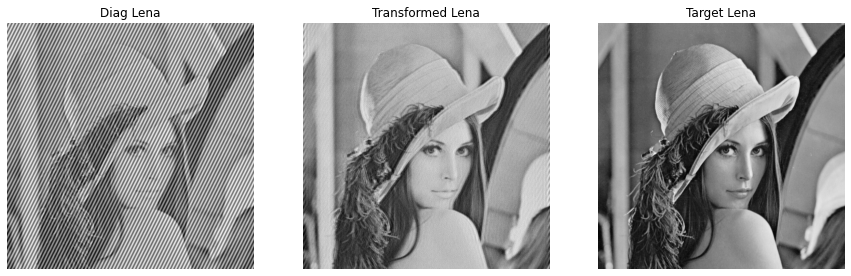

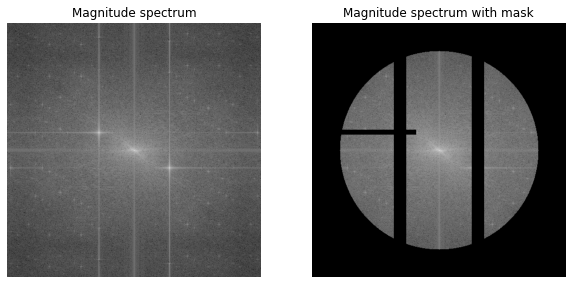

In [227]:
mse = (np.square(img_back.astype('int64') - img_target.astype('int64'))).mean()
print('mse:', mse, end='\n\n')

size = 5
fig, ax = plt.subplots(1, 3, figsize=(3 * size, size))
ax[0].set_title('Diag Lena')
ax[0].set_axis_off()
ax[0].imshow(img, cmap='gray')

ax[1].set_title('Transformed Lena')
ax[1].set_axis_off()
ax[1].imshow(img_back, cmap='gray')

ax[2].set_title('Target Lena')
ax[2].set_axis_off()
ax[2].imshow(img_target, cmap='gray')
plt.show()

fig, ax = plt.subplots(1, 2, figsize=(2 * size, size))
ax[0].set_title('Magnitude spectrum')
ax[0].set_axis_off()
ax[0].imshow(magnitude_spectrum, cmap='gray')

ax[1].set_title('Magnitude spectrum with mask')
ax[1].set_axis_off()
ax[1].imshow(magnitude_spectrum_mask, cmap='gray')
plt.show()

**5. (5 баллов)** Подавите шум на изображении $lena\_color\_512\_noise.tif$. Вычислите среднеквадратичную ошибку ($MSE$) для полученного результата и изображения $lena\_color\_512.tif$. Задача будет засчитана при $MSE < 150$. Тот, у кого по результатам проверки будет наименьшее значение $MSE$ среди всех студентов для этой задачи, получит призовую шоколадку.

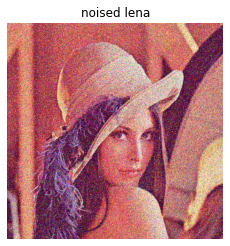

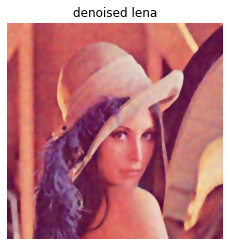

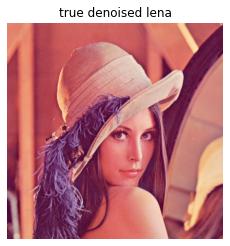

In [ ]:
img = cv2.imread("lena_color_512-noise.tif")
show(img)
plt.title('noised lena')
plt.show()

img_without_noise = cv2.medianBlur(img, 3)
img_without_noise = cv2.medianBlur(img_without_noise, 3)
img_without_noise = cv2.bilateralFilter(img_without_noise, 13, 70, 70)
show(img_without_noise)
plt.title('denoised lena')
plt.show()

img_target = cv2.imread("lena_color_512.tif")
show(img_target)
plt.title('true denoised lena')
plt.show()

In [ ]:
mse = (np.square(img_without_noise.astype('int64') - img_target.astype('int64'))).mean()
mse

104.67067337036133

**6. (5 баллов)** Выделите в изображении $table.jpg$ границы таблицы с использованием морфологических операций. Результатом обработки должно быть изображение, в котором удален весь текст и оставлены только границы таблицы

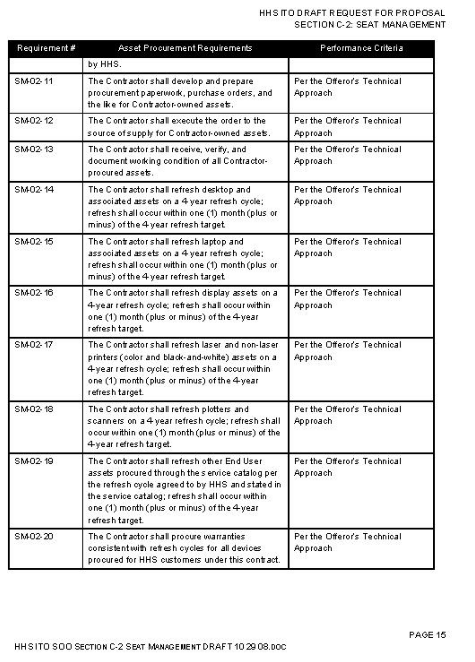

In [ ]:
table = cv2.imread("table.jpg")
show(table, size=9)

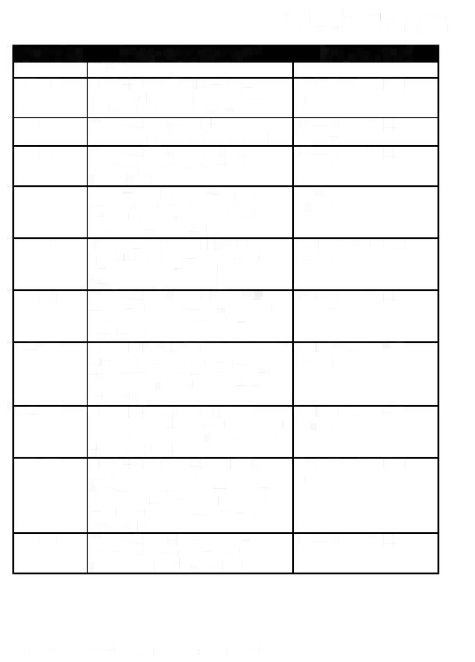

In [ ]:
img = cv2.bitwise_not(table)
kernel = cv2.getStructuringElement(cv2.MORPH_RECT,(1,9))
img1 = cv2.morphologyEx(img, cv2.MORPH_OPEN, kernel)

kernel = cv2.getStructuringElement(cv2.MORPH_RECT,(9,1))
img2 = cv2.morphologyEx(img, cv2.MORPH_OPEN, kernel)

img = img1 + img2
kernel = cv2.getStructuringElement(cv2.MORPH_RECT,(2,2))
img = cv2.morphologyEx(img, cv2.MORPH_CLOSE, kernel, iterations=5)

img = cv2.bitwise_not(img)
show(img, 9)


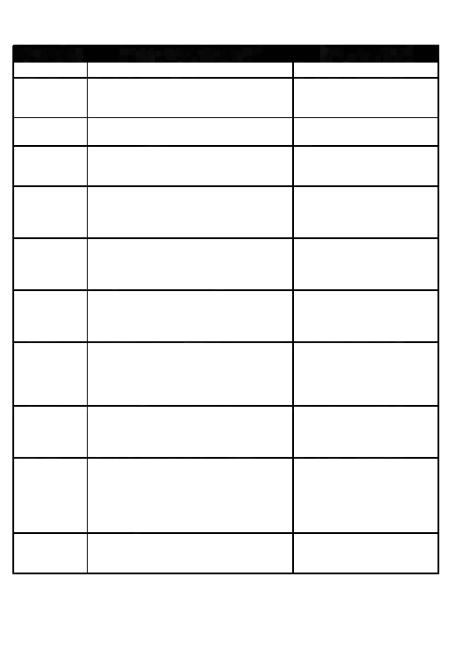

In [ ]:
# убираем серую грязь
img[img > 50] = 255
show(img, 9)

**7. (5 баллов)** Отделите монеты от фона на изображении $coins\_1.jpg$, отсортируйте монеты по убыванию размера. Сгенерируйте результирующее изображение с цветной разметкой областей, соответствующих монетам на исходном изображении: на черном фоне должны быть выделены разными цветами области, соответствующие монетам. В центре каждой выделенной области разместите порядковый номер монеты в соответствии с сортировкой монет по размеру (в центре области, соответствующей самой большой монете, должно стоять число 1)

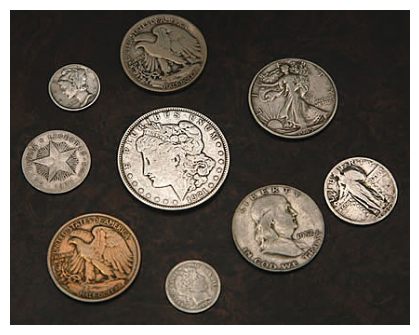

In [ ]:
coins_1 = cv2.imread("coins_1.jpg")
show(coins_1, size=4)

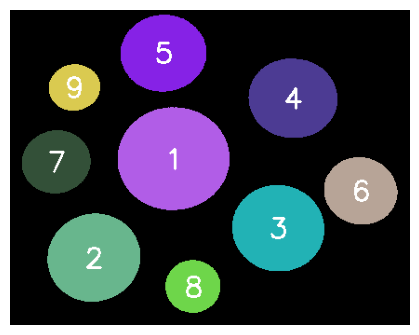

In [ ]:
img = cv2.cvtColor(coins_1, cv2.COLOR_BGR2GRAY)

# binarization
_, img = cv2.threshold(img, 90, 255, cv2.THRESH_BINARY)
# closing
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5,5))
mask = cv2.morphologyEx(img, cv2.MORPH_CLOSE, kernel, iterations=2)


# connected components
_, labels = cv2.connectedComponents(mask)
img = np.zeros((img.shape[0], img.shape[1], 3), dtype=np.uint8)


# coloring and defining of centers
centers = []
for i in range(1, amount):
  y, x = (labels == i).nonzero()
  cX, cY = np.ceil(np.mean(x)), np.ceil(np.mean(y)) 
  centers += [(int(cX), int(cY), len(x))]
  img[labels == i] = np.random.randint(0, 255, size=3, dtype=np.uint8)


# put number on coins sorted by size
centers = sorted(centers, key=lambda a: a[-1], reverse=True)
for i, c in enumerate(centers):
    cX, cY, _ = c
    cv2.putText(img, str(i + 1), (cX-10, cY+10), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)

show(img, size=4)    

**8. (5 баллов)** Отделите монеты от текста на изображении $coins\_2.jpg.$ Сгенерируйте по входному изображению два изображения: на одном должны остаться только монеты, весь текст должен быть удален; на втором изображении должен остаться только текст, все монеты должны быть удалены.

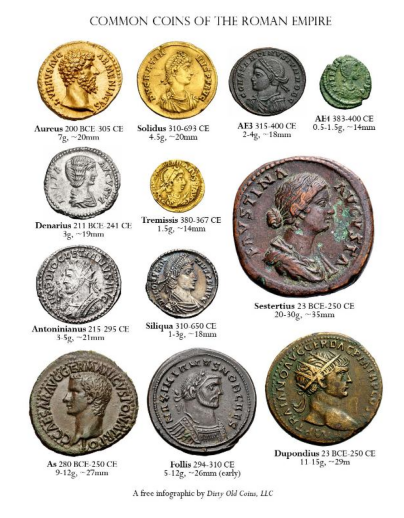

In [ ]:
coins_2 = cv2.imread("coins_2.jpg")
show(coins_2, size=7)

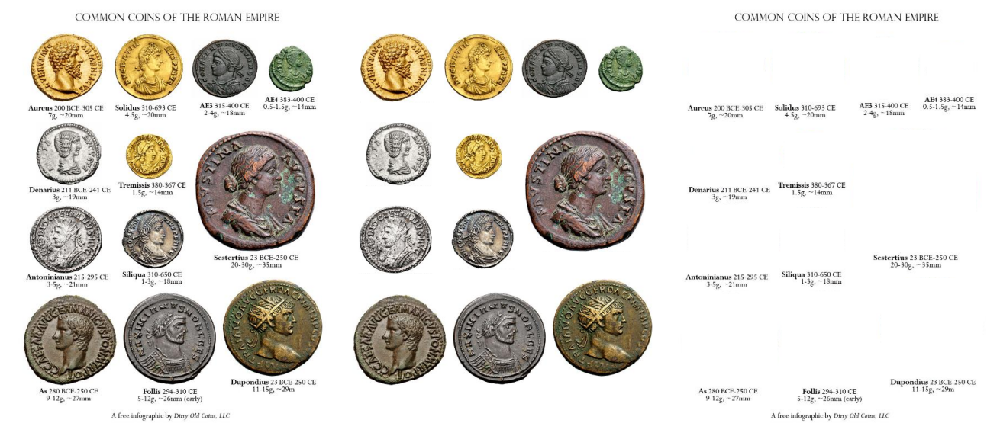

In [ ]:
image = coins_2.copy()

# Edges with canny
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
canny = cv2.Canny(gray, 230, 255, 1)
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3,3))
dilate = cv2.dilate(canny, kernel, iterations=1)

# Find contours
cnts = cv2.findContours(dilate, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[0]

img_coins = np.ones_like(image) * 255
img_text = coins_2.copy()

# Find bounding boxes and select only coins
image_number = 0
for c in cnts:
    x,y,w,h = cv2.boundingRect(c)
    if w + h > 150:
      img_coins[y:y+h, x:x+w] = image[y:y+h, x:x+w]
      img_text[y-1 : y+h+1, x-1 : x+w+1] = 255

result = np.concatenate((image, img_coins, img_text), axis=1)
show(result, size=18)


### Сравнение глобальных признаков 

Для задач 9 и 10 надо реализовать общую функцию, которая принимет на вход:

* список дескрипторов (**id**, и сам дескриптор) 
* количество максимально похожих для вывода **n**
* функцию сранения дескрипторов

и отдает **n** пар **id** максимально похожих изображений.

In [ ]:
def get_similar_imgs(descriptors, compare_func, output_size=20):
    cnt = len(descriptors)
    comp_matrix = np.full((cnt, cnt), fill_value=np.inf)
    comp_matrix = -comp_matrix if compare_func in [cv2.HISTCMP_CORREL,cv2.HISTCMP_INTERSECT] else comp_matrix
    
    if compare_func != l2_norm:
        compare = lambda a, b: cv2.compareHist(a, b, compare_func)
    else:
        compare = compare_func
    
    # construct compare matrix
    for i in range(cnt):
        for j in range(i+1, cnt):
            comp_matrix[i,j] = compare(descriptors[i][1], descriptors[j][1])

    comp_matrix = -comp_matrix if compare_func in \
                    [cv2.HISTCMP_CHISQR, cv2.HISTCMP_BHATTACHARYYA, l2_norm] else comp_matrix
    
    # select n best pairs
    idx = np.unravel_index(np.argsort(comp_matrix.ravel())[-output_size:], comp_matrix.shape)
    idx = list(zip(idx[0], idx[1]))
    
    id_list = [(descriptors[i][0], descriptors[j][0]) for i, j in idx]

    return id_list


In [ ]:
def plot_similar_pairs(images, id_list):
    for i, j in id_list:
        fig, (ax1, ax2) = plt.subplots(1, 2)
        ax1.set_axis_off()
        ax1.imshow(cv2.cvtColor(images[i], cv2.COLOR_BGR2RGB))
        ax2.set_axis_off()
        ax2.imshow(cv2.cvtColor(images[j], cv2.COLOR_BGR2RGB))

**9. (9 баллов)** Посмотрите на изображения в папке *Coral*. Посчитайте гистограммы изображений.  В этом задании надо попробовать:
* различные цветовые пространства (RGB, HSV, CIELab)
* различные способы разбиения на бины (разное количество для каждой характеристики)
* различные метрики сравнения $L_2$, $\chi^2$, пересечение гистограм

В итоге нужно сделать мини отчет по тому, какой метод раотает лучше. И в конце выведите на экран 20 пар изображений с максимально похожими гистограммами, которые получаются этим методом.

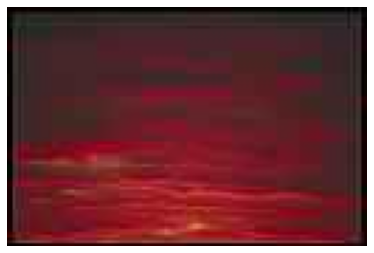

In [ ]:
import os
path = '/content/Corel'

images = {img: cv2.imread(path + '/' + img) for img in os.listdir(path)}

show(images['TN_191005.JPG'], size=5)

In [ ]:
# construct rgb hist
def hist_rgb(img, bins):
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    ranges = [0, 256] * 3
    channels = [0, 1, 2]
    
    img_hist = cv2.calcHist([img], channels , None, bins, ranges)
    img_hist = cv2.normalize(img_hist, None, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX)
    return img_hist


# construct hsv hist
def hist_hsv(img, bins):
    img = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    ranges = [0, 180, 0, 256]
    channels = [0, 1]
    
    img_hist = cv2.calcHist([img], channels , None, bins, ranges)
    img_hist = cv2.normalize(img_hist, None, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX)
    return img_hist


# construct hsv hist
def hist_lab(img, bins):
    img = cv2.cvtColor(img, cv2.COLOR_BGR2Lab)
    ranges = [0, 256, 0, 256]
    channels = [1, 2]
    
    img_hist = cv2.calcHist([img], channels , None, bins, ranges)
    img_hist = cv2.normalize(img_hist, None, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX)
    return img_hist


In [ ]:
rgb_descr = [[id, hist_rgb(img, bins=[50, 50, 50])] for id, img in images.items()]
hsv_descr = [[id, hist_hsv(img, bins=[70, 100])] for id, img in images.items()]
lab_descr = [[id, hist_lab(img, bins=[20,30])] for id, img in images.items()]

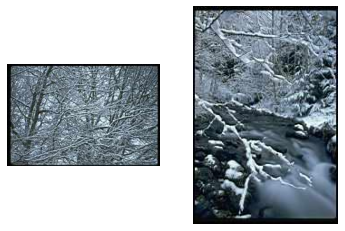

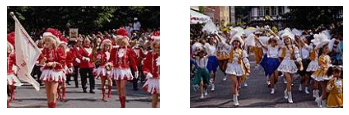

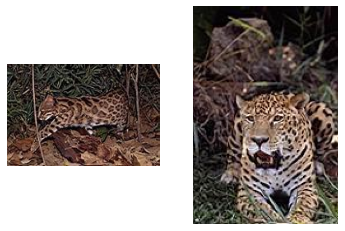

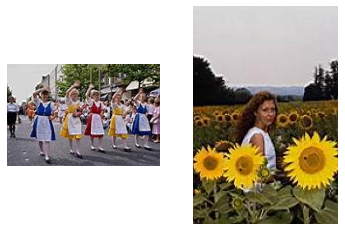

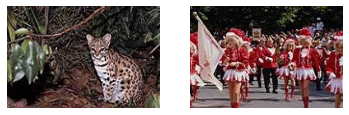

...

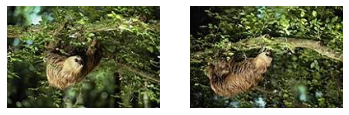

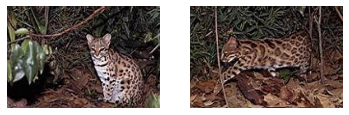

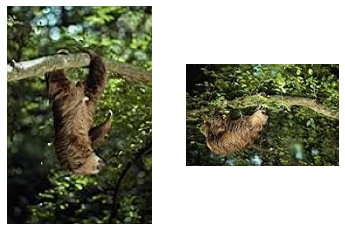

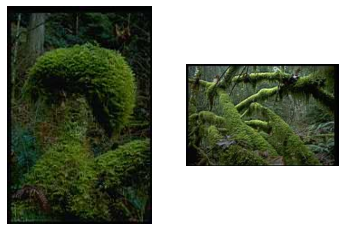

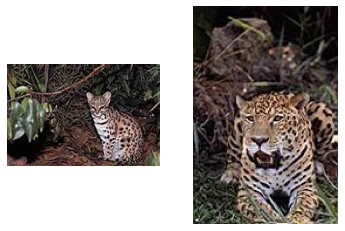

In [ ]:
rgb_best = get_similar_imgs(rgb_descr, cv2.HISTCMP_CORREL, output_size=20)
plot_similar_pairs(images, rgb_best)

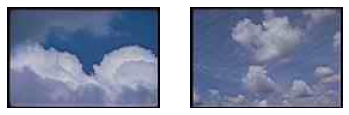

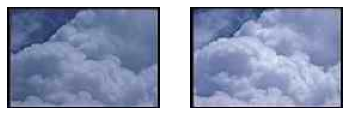

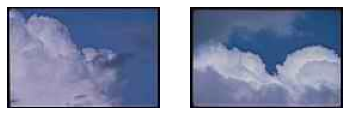

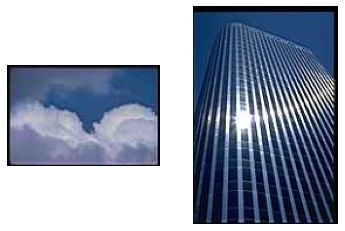

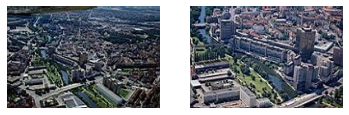

...

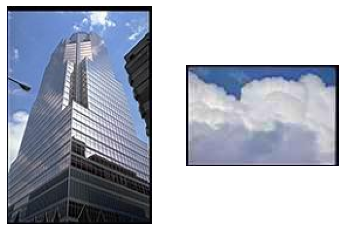

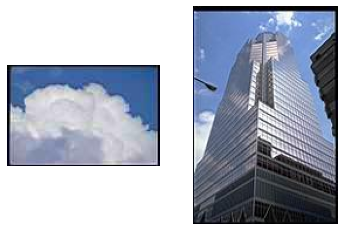

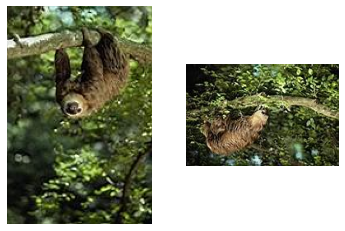

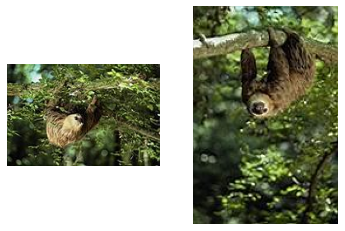

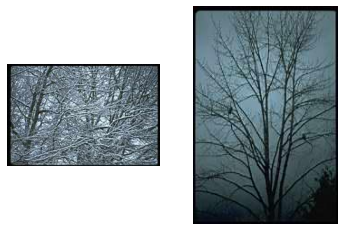

In [ ]:
lab_best = get_similar_imgs(lab_descr, cv2.HISTCMP_BHATTACHARYYA, output_size=20)
plot_similar_pairs(images, lab_best)

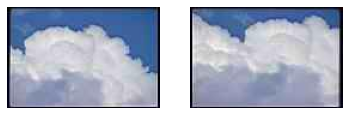

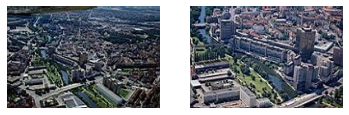

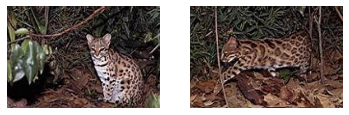

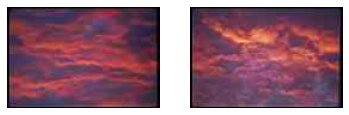

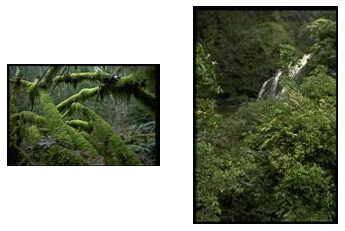

...

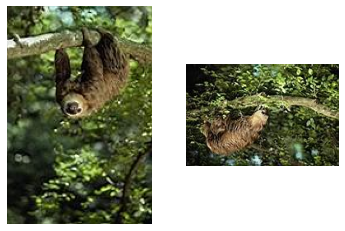

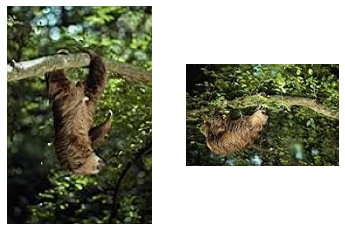

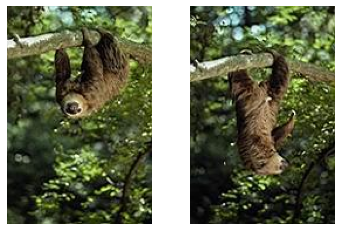

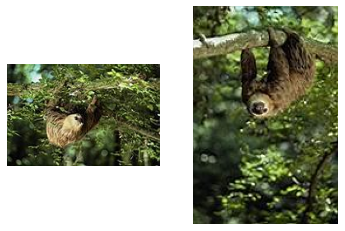

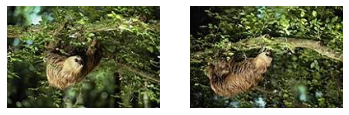

In [ ]:
hsv_best = get_similar_imgs(hsv_descr, cv2.HISTCMP_BHATTACHARYYA, output_size=20)
plot_similar_pairs(images, hsv_best)

Лучшая конфигурация получается при переводе картинок в пространство HSV, функцией сравнения `cv2.HISTCMP_BHATTACHARYYA` и подсчетом гистограмм с бинами `[50, 70]`

**10. (10 баллов)** Посмотрите на изображения в папке *leaves*. Посчитайте дескрипторы Фурье для каждого листочка изображений. Выведите на экран 20 пар изображений с максимально похожими дескрипторами.

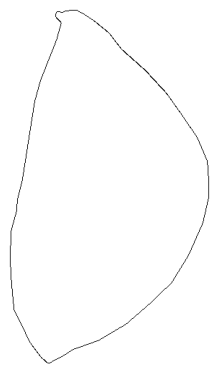

In [ ]:
import os
path = '/content/leaves'

images = {img: cv2.imread(path + '/' + img) for img in os.listdir(path)}

show(images['be3.tif'], size=5)

In [ ]:
def l2_norm(descr1, descr2):
    return np.linalg.norm(descr1-descr2, ord=2)

In [ ]:
def fourier(img, k=30):

    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    contour = (img == 0).astype('int8')
    contour = np.vstack(np.where(contour == 1)).T
    idx_mean = np.mean(contour, axis=0).astype('int')
    dist = np.linalg.norm(contour - idx_mean, axis=1, ord=2)

    real_part = np.array([np.mean(dist)])
    im_part = np.array([0])
    
    n = contour.shape[0]
    i = np.arange(n)
    real_part = np.append(real_part, 2 / n * dist @ np.array([np.cos(2 * np.pi * j * i / n) for j in range(1, k)]).T)
    real_part = np.append(real_part, 1 / n * dist @ np.array([np.cos(2 * np.pi * k * i / n)]).T)
    im_part = np.append(im_part, 2 / n * dist @ np.array([np.sin(2 * np.pi * j * i / n) for j in range(1, k + 1)]).T)

    res = np.sqrt(real_part ** 2 + im_part ** 2)
    res = np.abs(res / res[0])[1:]
    return res

In [ ]:
fourier_descr = [[id, fourier(img, k=50)] for id, img in images.items()]

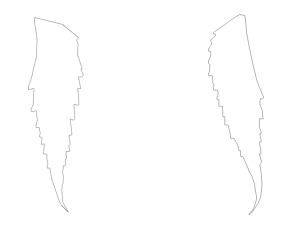

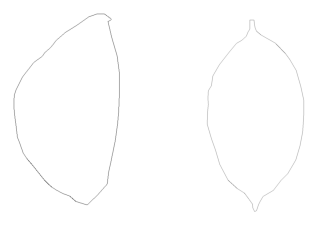

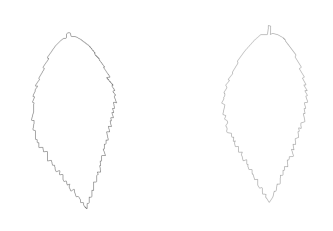

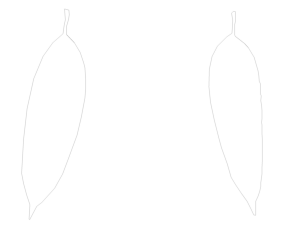

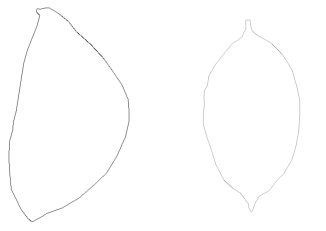

...

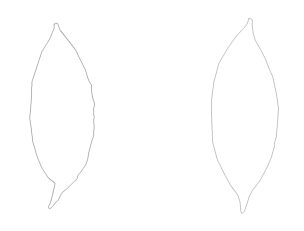

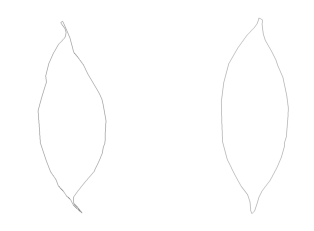

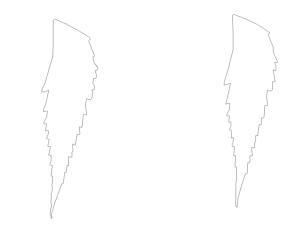

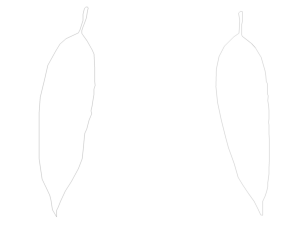

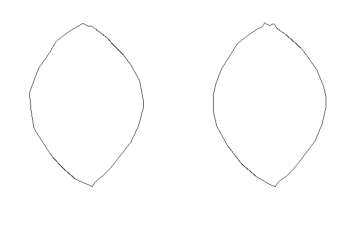

In [ ]:
fourier_best = get_similar_imgs(fourier_descr, l2_norm, output_size=20)
plot_similar_pairs(images, fourier_best)